In [21]:
%load_ext autoreload
%autoreload 2
import os
import sys
import shutil
import argparse
import time
import json
from datetime import datetime
from collections import defaultdict
from itertools import islice
import pickle
import copy
import numpy as np
import cv2
from easydict import EasyDict
from IPython.core.debugger import set_trace
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook

import torch
from torch import nn
from torch import autograd
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.nn.parallel import DistributedDataParallel
from tensorboardX import SummaryWriter

from mvn.models.triangulation import VolumetricTriangulationNet
from mvn.models.volumetric_adain import VolumetricTemporalAdaINNet

from mvn.models.pose_resnet import get_pose_net as get_pose_resnet
from mvn.models.v2v import AdaIN, V2VModel, Basic3DBlock, Res3DBlock, Upsample3DBlock, Pool3DBlock, EncoderDecorder
from mvn.models.loss import KeypointsMSELoss, KeypointsMSESmoothLoss, KeypointsMAELoss, KeypointsL2Loss, VolumetricCELoss
from mvn.utils import img, multiview, op, vis, misc, cfg
from mvn.datasets.human36m import Human36MTemporalDataset, Human36MMultiViewDataset
from mvn.datasets import utils as dataset_utils

from mvn.utils.multiview import project_3d_points_to_image_plane_without_distortion
from mvn.utils.vis import draw_2d_pose
from mvn.utils import img
from mvn.utils import volumetric
from mvn.utils import op
from mvn.utils import vis
from mvn.utils import misc
from mvn.utils import cfg
from mvn.datasets import utils as dataset_utils
from mvn.utils.img import image_batch_to_numpy, denormalize_image,to_numpy

def tensor2np(tensor):
    return tensor.clone().detach().cpu().numpy()

def visualize_torch_feature_maps(features_maps, max_channels=8):
    features_maps_np = tensor2np(features_maps)
    C_features_maps = features_maps_np.shape[-3]
    n_channels_style_vis = min(int(np.sqrt(C_features_maps)), max_channels)
    fig,axes = plt.subplots(ncols=n_channels_style_vis, 
                            nrows=n_channels_style_vis, 
                            figsize=(n_channels_style_vis*2,n_channels_style_vis*2))
    for i in range(n_channels_style_vis):
        for j in range(n_channels_style_vis):
            channel_number = i*n_channels_style_vis + j
            axes[i,j].imshow(features_maps_np[channel_number])

from torch.nn.utils.rnn import pack_padded_sequence
from pytorch_convolutional_rnn.convolutional_rnn import Conv2dLSTM, Conv2dPeepholeLSTM

from train import setup_human36m_dataloaders

device = 'cuda:0' #torch.cuda.current_device()

CONNECTIVITY_DICT = {
    'cmu': [(0, 2), (0, 9), (1, 0), (1, 17), (2, 12), (3, 0), (4, 3), (5, 4), (6, 2), (7, 6), (8, 7), (9, 10), (10, 11), (12, 13), (13, 14), (15, 1), (16, 15), (17, 18)],
    'coco': [(0, 1), (0, 2), (1, 3), (2, 4), (5, 7), (7, 9), (6, 8), (8, 10), (11, 13), (13, 15), (12, 14), (14, 16), (5, 6), (5, 11), (6, 12), (11, 12)],
    "mpii": [(0, 1), (1, 2), (2, 6), (5, 4), (4, 3), (3, 6), (6, 7), (7, 8), (8, 9), (8, 12), (8, 13), (10, 11), (11, 12), (13, 14), (14, 15)],
    "human36m": [(0, 1), (1, 2), (2, 6), (5, 4), (4, 3), (3, 6), (6, 7), (7, 8), (8, 16), (9, 16), (8, 12), (11, 12), (10, 11), (8, 13), (13, 14), (14, 15)],
    "kth": [(0, 1), (1, 2), (5, 4), (4, 3), (6, 7), (7, 8), (11, 10), (10, 9), (2, 3), (3, 9), (2, 8), (9, 12), (8, 12), (12, 13)],
}

def get_n(m):
    s = 0
    for param in m.parameters():
        s+=param.nelement()
    print (m.__class__, s//1024) 
print ('Done')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done


In [8]:
# experiment_root = './experiments/human36m/train/human36m_vol_baseline.yaml'
# config_path = experiment_root# experiment_root + '/config.yaml'

baseline_checkpoint = "../logs/spade_resnet_50/spade_debug/h36_sv32_dist_baseline_v2v-conf-vf64-lr1e-4_resnet50-gn_pf-lr1e-3_bs1-1_lr-1e-4_norot_gradclip-1e-2@23.06.2020-17:54:36/"
config_path = os.path.join(baseline_checkpoint, "config.yaml")
state_dict = torch.load(os.path.join(baseline_checkpoint, "checkpoints/weights.pth"))['model_state']

config = cfg.load_config(config_path)
train_loader, val_loader, _ = setup_human36m_dataloaders(config,
                                                         is_train=True,
                                                         distributed_train=False)

batch_size, dt, dilation = val_loader.batch_size, val_loader.dataset.dt, val_loader.dataset.dilation

pivot_type = config.dataset.pivot_type 
keypoints_per_frame = config.dataset.val.keypoints_per_frame if hasattr(config.dataset.val, 'keypoints_per_frame') else False
pivot_position = {'first':-1, 'intermediate':dt//2}[pivot_type]

print('Batch size:', batch_size, '\n',\
      'dt:', dt, '\n',\
      'dilation:', dilation, '\n',\
      'pivot_type:', pivot_type, '\n',\
      'pivot_position:', pivot_position,'\n',\
      'keypoints_per_frame', keypoints_per_frame)


Batch size: 1 
 dt: 1 
 dilation: 1 
 pivot_type: first 
 pivot_position: -1 
 keypoints_per_frame False


In [9]:
config.model.pelvis_type = 'gt'

model = {
    "vol": VolumetricTriangulationNet
}[config.model.name](config, device=device).to(device)
print ('Loaded {} model'.format(config.model.name))
model.load_state_dict(state_dict)

Loading pretrained weights from: ./data/pose_resnet_4.5_pixels_human36m.pth
Successfully loaded pretrained weights for backbone
Loaded vol model


<All keys matched successfully>

In [10]:
for batch in val_loader:
    if batch is None:
            continue
        
    images_batch, keypoints_3d_gt, keypoints_3d_validity_batch_gt, proj_matricies_batch = dataset_utils.prepare_batch(batch, device)
    break

In [13]:
(keypoints_3d_pred, 
features_pred, 
volumes_pred, 
confidences_pred, 
cuboids_pred, 
coord_volumes_pred, 
base_points_pred) = model(images_batch, batch)  

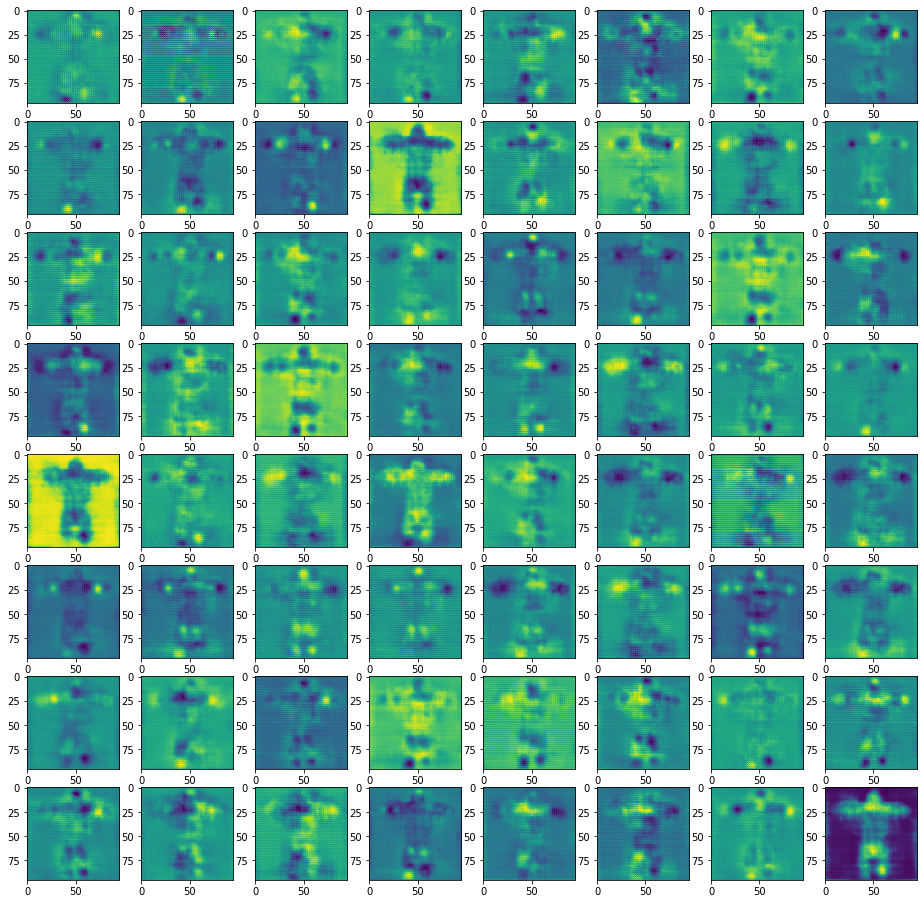

In [22]:
batch_index,fictive_view=0,0
visualize_torch_feature_maps(features_pred[batch_index,fictive_view],8)

# Generate 3D target

In [12]:
# # does not support time dimension!
# self = model
# from mvn.utils.op import get_coord_volumes, unproject_heatmaps, integrate_tensor_3d_with_coordinates
# coord_volumes, _, _ = get_coord_volumes(self.kind, 
#                                         self.training, 
#                                         self.rotation,
#                                         self.cuboid_side,
#                                         64, # self.volume_size 
#                                         device,
#                                         keypoints=keypoints_3d_gt
#                                         )

# batch_size, n_joints = keypoints_3d_gt.shape[0], keypoints_3d_gt.shape[-2]
# volume_size = coord_volumes.shape[-2]

# coord_volume_unsq = coord_volumes.unsqueeze(1)
# keypoints_gt_i_unsq = keypoints_3d_gt.unsqueeze(2).unsqueeze(2).unsqueeze(2)

# dists = torch.sqrt(((coord_volume_unsq - keypoints_gt_i_unsq) ** 2).sum(-1))
# H = torch.zeros_like(dists)

# for k,w in zip([1,2,3,4,5],
#               [3,3,3,3,3]):
#     n_cells = k**3
#     knn = dists.view(*dists.shape[:-3],-1).topk(n_cells,dim=-1,largest=False) 
#     radius = knn.values.max(dim=-1)[0].unsqueeze(2).unsqueeze(2).unsqueeze(2)
#     mask = dists <= radius
# #     assert mask.sum() / n_cells == 17
#     H[mask] += w   
# H_soft = F.softmax(H.view(*H.shape[:-3], -1),dim=-1).view(*mask.shape)

In [19]:
import plotly.graph_objects as go
import numpy as np
import colorlover as cl

# X, Y, Z = np.mgrid[-8:8:40j, -8:8:40j, -8:8:40j]
# values = np.sin(X*Y*Z) / (X*Y*Z)

batch_index = 0
values = volumes_pred[batch_index][9].detach().cpu()
coord_volumes = coord_volumes_pred

X = coord_volumes[batch_index][...,0].detach().cpu().numpy()
Y = coord_volumes[batch_index][...,1].detach().cpu().numpy()
Z = coord_volumes[batch_index][...,2].detach().cpu().numpy()

keypoints = keypoints_3d_gt.view(-1, 3).detach().cpu().numpy()
color_kp = cl.scales['10']['div']['RdYlBu'][-1]
plotly_data = []
# connections
connectivity = CONNECTIVITY_DICT['human36m']
for (index_from, index_to) in connectivity:
    xs, ys, zs = [np.array([keypoints[index_from, j], keypoints[index_to, j]]) for j in range(3)]

    plotly_data.append(go.Scatter3d(x=xs, y=ys, z=zs,
                         marker=dict(size=4,color='green'),
                         line=dict(color='green',width=2)))
plotly_data.append(go.Volume(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=values.flatten(),
#     isomin=0.1,
#     isomax=0.8,
    opacity=0.1, # needs to be small to see through all surfaces
    surface_count=12, # needs to be a large number for good volume rendering
    ))

fig = go.Figure(data=plotly_data)
fig.show()

# Grid

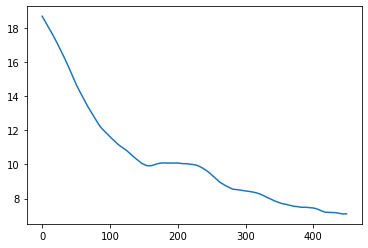

In [88]:
coord_volumes_opt = coord_volumes_pred.clone().detach().cpu().requires_grad_(True)
keypoints_3d_gt = keypoints_3d_gt.clone().detach().cpu().requires_grad_(False)
volumes = volumes_pred.clone().detach().cpu().requires_grad_(False)
opt = torch.optim.Adam([coord_volumes_opt], lr=1e-1)

losses = []
for i in tqdm_notebook(range(450)):
    
    vol_keypoints_3d = torch.einsum("bnxyz, bxyzc -> bnc", volumes, coord_volumes_opt)
    
    L = torch.sqrt((vol_keypoints_3d - keypoints_3d_gt)**2).mean()
    L.backward()
    opt.step()
    losses.append(L.item())
plt.plot(losses)    

# Visualize

In [89]:
coord_volumes_vis = coord_volumes_opt[0, 10:20:2, 10:20:2, 10:30:2,...].contiguous()
coord_volumes_vis_2 = coord_volumes_pred.cpu()[0, 10:20:2, 10:20:2, 10:30:2,...].contiguous()

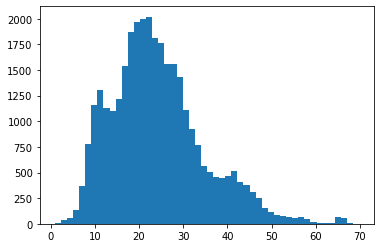

In [108]:
diffs = (coord_volumes_opt - coord_volumes_pred.cpu()).abs().view(-1,3).mean(-1).detach().numpy()
center = coord_volumes_pred[0,16,16,16].cpu()
distance = (coord_volumes_pred.cpu().view(-1,3) - center).abs().mean(-1).detach().numpy()
plt.hist(diffs, bins=50)
plt.show()

In [92]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
import plotly.graph_objs as go
import colorlover as cl

coords = coord_volumes_vis.view(-1, 3).detach().cpu().numpy()
coords2 = coord_volumes_vis_2.view(-1, 3).detach().cpu().numpy()

keypoints = keypoints_3d_pred.view(-1, 3).detach().cpu().numpy()
keypoints2 = vol_keypoints_3d.view(-1, 3).detach().cpu().numpy()

init_notebook_mode(connected=False)  
color_grid = cl.scales['10']['div']['RdYlBu'][0]
color_kp = cl.scales['10']['div']['RdYlBu'][-1]
plotly_data = []

grid = dict(x = coords[:,0],
            y = coords[:,1],
            z = coords[:,2],
            type = "scatter3d",    
            mode = 'markers',
            marker = dict(size=5,
                          color=color_grid,
                          line=dict(width=0)))
plotly_data.append(grid)

# 
# grid2 = dict(x = coords2[:,0],
#             y = coords2[:,1],
#             z = coords2[:,2],
#             type = "scatter3d",    
#             mode = 'markers',
#             marker = dict(size=5,
#                           color='orange',
#                           line=dict(width=0)))
# plotly_data.append(grid2)


# connections
connectivity = CONNECTIVITY_DICT['human36m']
for (index_from, index_to) in connectivity:
    xs, ys, zs = [np.array([keypoints[index_from, j], keypoints[index_to, j]]) for j in range(3)]

    plotly_data.append(go.Scatter3d(x=xs, y=ys, z=zs,
                         marker=dict(size=4,color='green'),
                         line=dict(color='green',width=2)))
    
# connections
connectivity = CONNECTIVITY_DICT['human36m']
for (index_from, index_to) in connectivity:
    xs, ys, zs = [np.array([keypoints2[index_from, j], keypoints2[index_to, j]]) for j in range(3)]

    plotly_data.append(go.Scatter3d(x=xs, y=ys, z=zs,
                         marker=dict(size=4,color='blue'),
                         line=dict(color='blue',width=2)))    


fig = go.Figure(data=plotly_data)
iplot(fig, show_link = False)

# Grid

In [1]:
grid = np.array([[[0.5, 0.5],[1.5,0.5]], [[0.5, 1.5], [1.5, 1.5]]])
grid = grid.reshape(-1,2)

NameError: name 'np' is not defined

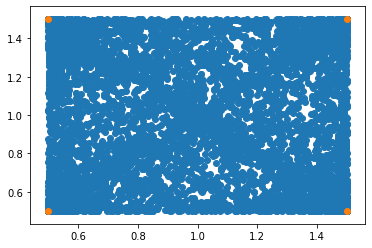

In [180]:
size = grid.shape[0]
points = []
for i in range(10000):
    weights = softmax(np.random.random_sample(size=size)*np.random.randint(low = -10, high = 10, size=size))[:,None]
    assert( np.isclose(weights.sum(), 1) )
    point = (grid * weights).sum(0)
    points.append(point)
points = np.array(points)    
plt.scatter(points[:,0], points[:,1])
plt.scatter(grid[:,0], grid[:,1])


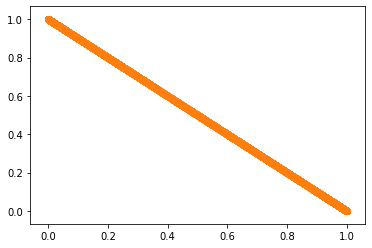

In [183]:
grid2 = np.array([[0, 1],[1,0]])
grid2 = grid2.reshape(-1,2)
size = grid2.shape[0]

plt.scatter(grid2[:,0], grid2[:,1])
points = []
for i in range(10000):
    weights = softmax(np.random.random_sample(size=size)*np.random.randint(low = -10, high = 10, size=size))[:,None]
    assert( np.isclose(weights.sum(), 1) )
    point = (grid2 * weights).sum(0)
    points.append(point)
points = np.array(points)    
plt.scatter(points[:,0], points[:,1])